In [3]:
# Import PySTAC Client
from pystac_client import Client

In [4]:
# Connect to the catalog
catalog = Client.open('https://earth-search.aws.element84.com/v1/')
catalog

<Client id=earth-search-aws>

In [5]:
# Get collections
collections = catalog.get_collections()
collections

<generator object Client.get_collections at 0x7f6dd7f5aa40>

In [6]:
# Get the first collection
collection = next(collections)
collection

<CollectionClient id=sentinel-2-pre-c1-l2a>

In [7]:
# Display collection ids
for collection in collections:
    print(collection.id)

cop-dem-glo-30
naip
cop-dem-glo-90
landsat-c2-l2
sentinel-2-l2a
sentinel-2-l1c
sentinel-2-c1-l2a
sentinel-1-grd


In [8]:
# Get collection with a specific id
collection = catalog.get_collection('sentinel-2-l2a')
collection

<CollectionClient id=sentinel-2-l2a>

In [9]:
# Get items in the collection
items = collection.get_items()
items

<generator object CollectionClient.get_items at 0x7f6dd7fec4a0>

In [10]:
# Get the first item
item = next(items)
item

<Item id=S2A_26SKF_20241208_0_L2A>

In [11]:
# Get item with a specific id
item = collection.get_item('S2B_3UXV_20241124_0_L2A')
#item = collection.get_item('LC09_L2SP_062046_20241130_20241201_02_T1_ST')
item

<Item id=S2B_3UXV_20241124_0_L2A>

In [12]:
# It is better to use search functionality to get specific items
# Note: Empty search will return all items in all collections.
# Note: Search is lazy, i.e. does not retrieve metadata unless required.
results = catalog.search()

In [13]:
# Display number of items matching the search query
# Note: There are ore then 105 million items in the catalog!
results.matched()

105825330

In [14]:
# Get the first item
item = next(results.items())
item

<Item id=S1A_IW_GRDH_1SDV_20241208T160720_20241208T160745_056903_06FD13>

In [15]:
# Add collection criterion to reduce the number of matches
results = catalog.search(
    collections=['sentinel-2-l2a']
)

In [16]:
results.matched()

38381185

In [17]:
# Define an area of interest (AOI) for spatial filtering
# Note: It is a GeoJSON dictionary for a point. It is possible to use others as well, e.g. polygon
# Note: You can use https://geojson.io to draw features and get corresponding GeoJSON.
aoi = {
    "coordinates": [
     38.999828180955156,-6.421504885922214
    ],
    "type": "Point"
}

In [18]:
# Refine AOI
# Note: 5 digits is enough for ~1 m accuracy.
aoi = {
    "coordinates": [38.99982, -6.42150],
    "type": "Point"
}

In [19]:
# Add spatial criterion to reduce the number of matches
results = catalog.search(
    collections=['sentinel-2-l2a'],
    intersects=aoi,
)

In [20]:
results.matched()

738

In [21]:
# Add date range criterion to reduce the number of matches
# Note: You can also specify a date, a partial date (e.g. 2024), or range of partial dates.
# results = catalog.search(
#     collections=['sentinel-2-l2a'],
#     intersects=aoi,
#     datetime=['2018-12-01', '2018-12-30'],  # ['2024']  ['2024-06']
# )

results = catalog.search(
     collections=['sentinel-2-l2a'],
     intersects=aoi,
     datetime=['2024-06-01', '2024-06-30'],  # ['2024']  ['2024-06']
)



In [22]:
results.matched()

6

In [23]:
# Get items
# Note: Does not return a generator, so all metadata needs to be retrieved. For many items this make take time.
items = results.item_collection()
items

In [24]:
# Sort items by date
# Note: For more information see https://pystac-client.readthedocs.io/en/stable/usage.html#sort-extension
results = catalog.search(
    collections=['sentinel-2-l2a'],
    intersects=aoi,
    datetime=['2024-06-01', '2024-06-30'],
    sortby='properties.datetime',
)

In [25]:
items = results.item_collection()
items

In [26]:
# Get the first item (now the oldest in the specified date range as it is sorted in ascending order by datetime)
item = items[1]
item

<Item id=S2A_37MDN_20240608_0_L2A>

In [27]:
# Display item datetime
item.datetime

datetime.datetime(2024, 6, 8, 7, 51, 56, 725000, tzinfo=tzutc())

In [28]:
# Display item bounding box
item.bbox

[38.09366384102202,
 -7.325735423883312,
 39.088418599591584,
 -6.3317206341458965]

In [29]:
# Display item geometry
item.geometry

{'type': 'Polygon',
 'coordinates': [[[38.09553082328002, -6.3317206341458965],
   [38.09366384102202, -7.3248315240753],
   [39.088418599591584, -7.325735423883312],
   [39.08823643412424, -6.33250094204297],
   [38.09553082328002, -6.3317206341458965]]]}

In [30]:
# Import GeoPandas to quickly display items on a map
import geopandas
import matplotlib.pyplot as plt
from mapclassify import classify 
from matplotlib import colors

In [31]:
# Create geodataframe from items
gdf = geopandas.GeoDataFrame.from_features(items)

In [32]:
gdf

,geometry,created,platform,constellation,instruments,eo:cloud_cover,proj:epsg,mgrs:utm_zone,mgrs:latitude_band,mgrs:grid_square,...,s2:datastrip_id,s2:granule_id,s2:reflectance_conversion_factor,datetime,s2:sequence,earthsearch:s3_path,earthsearch:payload_id,earthsearch:boa_offset_applied,processing:software,updated
0,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-03T11:49:42.794Z,sentinel-2b,sentinel-2,[msi],33.117980,32737,37,M,DN,...,S2B_OPER_MSI_L2A_DS_2BPS_20240603T094932_S2024...,S2B_OPER_MSI_L2A_TL_2BPS_20240603T094932_A0378...,0.973029,2024-06-03T07:51:52.616000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/3ee4...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-03T11:49:42.794Z
1,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-08T13:45:28.713Z,sentinel-2a,sentinel-2,[msi],22.796886,32737,37,M,DN,...,S2A_OPER_MSI_L2A_DS_2APS_20240608T113207_S2024...,S2A_OPER_MSI_L2A_TL_2APS_20240608T113207_A0468...,0.971560,2024-06-08T07:51:56.725000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/fb2d...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-08T13:45:28.713Z
2,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-14T14:42:42.537Z,sentinel-2b,sentinel-2,[msi],0.881941,32737,37,M,DN,...,S2B_OPER_MSI_L2A_DS_2BPS_20240613T094853_S2024...,S2B_OPER_MSI_L2A_TL_2BPS_20240613T094853_A0379...,0.970300,2024-06-13T07:51:54.088000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/846b...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-14T14:42:42.537Z
3,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-18T13:49:24.609Z,sentinel-2a,sentinel-2,[msi],93.459731,32737,37,M,DN,...,S2A_OPER_MSI_L2A_DS_2APS_20240618T112345_S2024...,S2A_OPER_MSI_L2A_TL_2APS_20240618T112345_A0469...,0.969257,2024-06-18T07:51:56.451000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/d9a9...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-18T13:49:24.609Z
4,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-29T05:41:51.349Z,sentinel-2b,sentinel-2,[msi],32.934931,32737,37,M,DN,...,S2B_OPER_MSI_L2A_DS_2BPS_20240623T095506_S2024...,S2B_OPER_MSI_L2A_TL_2BPS_20240623T095506_A0381...,0.968437,2024-06-23T07:51:53.741000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/ac6a...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-29T05:41:51.349Z
5,"POLYGON ((38.09553 -6.33172, 38.09366 -7.32483...",2024-06-29T17:44:16.154Z,sentinel-2a,sentinel-2,[msi],39.041585,32737,37,M,DN,...,S2A_OPER_MSI_L2A_DS_2APS_20240628T115550_S2024...,S2A_OPER_MSI_L2A_TL_2APS_20240628T115550_A0470...,0.967845,2024-06-28T07:51:53.711000Z,0,s3://sentinel-cogs/sentinel-s2-l2a-cogs/37/M/D...,roda-sentinel2/workflow-sentinel2-to-stac/d7c5...,True,{'sentinel2-to-stac': '0.1.1'},2024-06-29T17:44:16.154Z


In [33]:
# Display map of items
# Note: No background layer is visible, because no CRS information was provided.
gdf.explore()

In [34]:
# Recreate geodataframe with CRS information
gdf = geopandas.GeoDataFrame.from_features(items, crs="epsg:4326")
# 4326

In [35]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [36]:
# Display map of items
# Display only the first item on the map
gdf[0:1].explore()

In [37]:
# List assets of the item
item.assets

{'aot': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/AOT.tif>,
 'blue': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/B02.tif>,
 'coastal': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/B01.tif>,
 'granule_metadata': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/granule_metadata.xml>,
 'green': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/B03.tif>,
 'nir': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/B08.tif>,
 'nir08': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0

In [38]:
# Get URL address of the thumbnail image
url = item.assets['thumbnail'].href
url

'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2A_37MDN_20240608_0_L2A/thumbnail.jpg'

In [39]:
# Add cloud cover less than 5% criterio
# Note: For more information see https://pystac-client.readthedocs.io/en/stable/usage.html#sort-extension
results = catalog.search(
    collections=['sentinel-2-l2a'],
    intersects=aoi,
    datetime=['2024-06-01', '2024-06-30'],
    query=['eo:cloud_cover<5'],
    sortby='properties.datetime',
)

In [40]:
results.matched()

1

In [41]:
# Get items
items = results.item_collection()
items

In [42]:
# Map items
gdf = geopandas.GeoDataFrame.from_features(items, crs="epsg:4326")

In [43]:
gdf.explore()

In [44]:
# Get the first item
item = items[0]
item

<Item id=S2B_37MDN_20240613_0_L2A>

In [45]:
# Get URL address of the thumbnail image
url = item.assets['thumbnail'].href
url

'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/thumbnail.jpg'

In [46]:
# Display thumbnail image inside the notebook
from IPython.display import Image

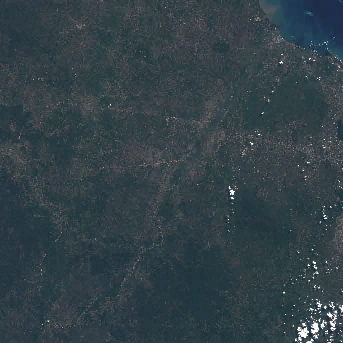

In [47]:
Image(url)

In [48]:
# Download the thumbnail image as 'thumbnail.jpg'
import urllib.request
urllib.request.urlretrieve(url, "thumbnail.jpg")

('thumbnail.jpg', <http.client.HTTPMessage at 0x7f6daa5b0b80>)

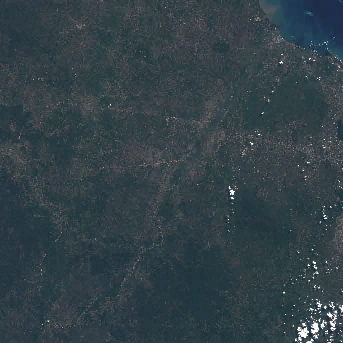

In [49]:
# You can display the local copy as well
Image('thumbnail.jpg')

In [50]:
# Get URL address of the near-infrared asset
# Note: You can download the image locally by clicking the link
url_nir = item.assets['nir'].href
url_nir

'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B08.tif'

In [51]:
# Download near-infrared image as 'B08.tif'
urllib.request.urlretrieve(url_nir, "B08.tif")

('B08.tif', <http.client.HTTPMessage at 0x7f6daa5b1a80>)

In [52]:
# Get URL address of the red asset
# Note: You can download the image locally by clicking the link
url_red = item.assets['red'].href
url_red

'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B04.tif'

In [53]:
# Download red image as 'B04.tif'
urllib.request.urlretrieve(url_red, "B04.tif")

('B04.tif', <http.client.HTTPMessage at 0x7f6daa5b37f0>)

In [54]:
# Get URL address of the red asset
# Note: You can download the image locally by clicking the link
url_green = item.assets['green'].href
url_green

'https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B03.tif'

In [55]:
# Download red image as 'B03.tif'
urllib.request.urlretrieve(url_green, "B03.tif")

('B03.tif', <http.client.HTTPMessage at 0x7f6daa5b1f90>)

In [56]:
# Open the image by using rasterio
# Note: It will only read metadata to open the image, not the data.
import rasterio 

src_nir = rasterio.open(url_nir, 'r')

src_nir


<open DatasetReader name='https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B08.tif' mode='r'>

In [57]:
src_red = rasterio.open(url_red, 'r')

src_red

<open DatasetReader name='https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B04.tif' mode='r'>

In [58]:
src_green = rasterio.open(url_green, 'r')

src_green

<open DatasetReader name='https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B03.tif' mode='r'>

In [59]:
# Display image dimensions
src_nir.shape

(10980, 10980)

In [60]:
src_nir.count

1

In [61]:
# Display image bounds
src_nir.bounds

BoundingBox(left=399960.0, bottom=9190240.0, right=509760.0, top=9300040.0)

In [62]:
# Display image transform
src_nir.transform

Affine(10.0, 0.0, 399960.0,
       0.0, -10.0, 9300040.0)

In [63]:
# Display image CRS
# Note: It is UTM Zone 32N; hence, it is different from the geometry of the item, which is geographic.
src_nir.crs

CRS.from_epsg(32737)

In [64]:
# Display image indexes
src_nir.indexes

(1,)

In [65]:
# Read the data
# Note: This will read all data; hence, it needs to download all of it, which takes time.
# Note: We can prevent this by reading only the data we need.
data_nir = src_nir.read(1)

In [66]:
# Import RasterIO Window to be able to specify the area we are interested in for reading
from rasterio.windows import Window

In [67]:
# Set window as column 0, row 0, width 500, height 500.
window = Window(0, 0, 500, 500)

In [68]:
# Display data
# Note: It is 16 bit unsinged integer, which needs to be scaled to get the actual reflectance
# Question: Why they didn't provide reflectance values directly?
data_nir

array([[2554, 2454, 2554, ...,  194,  205,  208],
       [2398, 2398, 2380, ...,  222,  226,  230],
       [2666, 2416, 2316, ...,  218,  211,  226],
       ...,
       [2280, 2228, 2336, ..., 3808, 3636, 3447],
       [2592, 2379, 2225, ..., 3396, 3332, 3236],
       [2833, 2587, 2299, ..., 3167, 3228, 3225]], dtype=uint16)

In [69]:
# Get asset information
asset_nir = item.assets['nir']
asset_nir

<Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B08.tif>

In [70]:
# Get band information from the asset
band_nir = asset_nir.ext.raster.bands[0]
band_nir

<Raster Band>

In [71]:
# Scale data according to the band scale and offset information
scaled_data_nir = data_nir * band_nir.scale + band_nir.offset
scaled_data_nir

array([[ 0.1554,  0.1454,  0.1554, ..., -0.0806, -0.0795, -0.0792],
       [ 0.1398,  0.1398,  0.138 , ..., -0.0778, -0.0774, -0.077 ],
       [ 0.1666,  0.1416,  0.1316, ..., -0.0782, -0.0789, -0.0774],
       ...,
       [ 0.128 ,  0.1228,  0.1336, ...,  0.2808,  0.2636,  0.2447],
       [ 0.1592,  0.1379,  0.1225, ...,  0.2396,  0.2332,  0.2236],
       [ 0.1833,  0.1587,  0.1299, ...,  0.2167,  0.2228,  0.2225]])

In [72]:
# Plot data
# Note: It is nice to read a small area, but it is an arbitrary area. We need to find a way to read a specific area.
import rasterio.plot

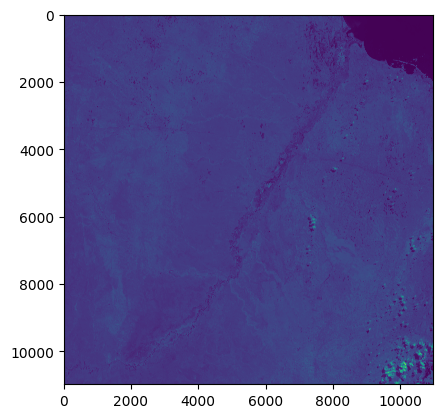

<Axes: >

In [73]:
rasterio.plot.show(scaled_data_nir)

Red Band - B04

In [74]:
# Read the data
# Note: This will read all data; hence, it needs to download all of it, which takes time.
# Note: We can prevent this by reading only the data we need.
data_red = src_red.read(1)

In [75]:
# Display data
# Note: It is 16 bit unsinged integer, which needs to be scaled to get the actual reflectance
# Question: Why they didn't provide reflectance values directly?
data_red

array([[393, 376, 413, ..., 237, 240, 243],
       [440, 392, 380, ..., 250, 252, 265],
       [484, 385, 366, ..., 250, 247, 260],
       ...,
       [512, 424, 527, ..., 379, 411, 456],
       [510, 448, 597, ..., 466, 548, 603],
       [382, 498, 653, ..., 574, 614, 625]], dtype=uint16)

In [76]:
# Get asset information
asset_red = item.assets['red']
asset_red

<Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B04.tif>

In [77]:
# Get band information from the asset
band_red = asset_red.ext.raster.bands[0]
band_red

<Raster Band>

In [78]:
# Scale data according to the band scale and offset information
scaled_data_red = data_red * band_red.scale + band_red.offset
scaled_data_red

array([[-0.0607, -0.0624, -0.0587, ..., -0.0763, -0.076 , -0.0757],
       [-0.056 , -0.0608, -0.062 , ..., -0.075 , -0.0748, -0.0735],
       [-0.0516, -0.0615, -0.0634, ..., -0.075 , -0.0753, -0.074 ],
       ...,
       [-0.0488, -0.0576, -0.0473, ..., -0.0621, -0.0589, -0.0544],
       [-0.049 , -0.0552, -0.0403, ..., -0.0534, -0.0452, -0.0397],
       [-0.0618, -0.0502, -0.0347, ..., -0.0426, -0.0386, -0.0375]])

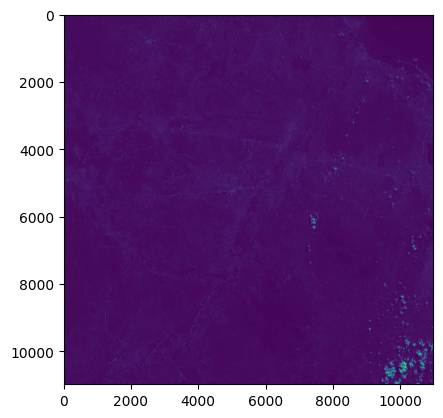

<Axes: >

In [79]:
rasterio.plot.show(scaled_data_red)

In [80]:
# Read the data
# Note: This will read all data; hence, it needs to download all of it, which takes time.
# Note: We can prevent this by reading only the data we need.
data_green = src_green.read(1)

In [81]:
# Display data
# Note: It is 16 bit unsinged integer, which needs to be scaled to get the actual reflectance
# Question: Why they didn't provide reflectance values directly?
data_green

array([[526, 507, 548, ..., 324, 346, 346],
       [542, 504, 502, ..., 348, 357, 356],
       [598, 493, 485, ..., 326, 337, 348],
       ...,
       [580, 523, 616, ..., 677, 691, 690],
       [602, 597, 628, ..., 712, 755, 764],
       [568, 648, 620, ..., 762, 768, 784]], dtype=uint16)

In [82]:
# Get asset information
asset_green = item.assets['green']
asset_green

<Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/37/M/DN/2024/6/S2B_37MDN_20240613_0_L2A/B03.tif>

In [83]:
# Get band information from the asset
band_green = asset_green.ext.raster.bands[0]
band_green

<Raster Band>

In [84]:
# Scale data according to the band scale and offset information
scaled_data_green = data_green * band_green.scale + band_green.offset
scaled_data_green

array([[-0.0474, -0.0493, -0.0452, ..., -0.0676, -0.0654, -0.0654],
       [-0.0458, -0.0496, -0.0498, ..., -0.0652, -0.0643, -0.0644],
       [-0.0402, -0.0507, -0.0515, ..., -0.0674, -0.0663, -0.0652],
       ...,
       [-0.042 , -0.0477, -0.0384, ..., -0.0323, -0.0309, -0.031 ],
       [-0.0398, -0.0403, -0.0372, ..., -0.0288, -0.0245, -0.0236],
       [-0.0432, -0.0352, -0.038 , ..., -0.0238, -0.0232, -0.0216]])

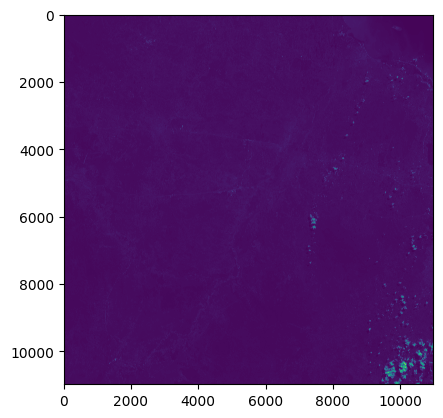

<Axes: >

In [85]:
rasterio.plot.show(scaled_data_green)

In [86]:
# Import Shapely to enable designation of a custom area by providing corresponding window
# Note: We need some preprocessing, as the CRS of the image is UTM.
import shapely

In [87]:
# Define area of interest polygon as GeoJSON string
aoi = '''
{
   "coordinates": [
          [
            [
              38.5513639024837,
              -6.386527687031872
            ],
            [
              38.5513639024837,
              -6.712371750140903
            ],
            [
              39.035604148587,
              -6.712371750140903
            ],
            [
              39.035604148587,
              -6.386527687031872
            ],
            [
              38.5513639024837,
              -6.386527687031872
            ]
          ]
        ],
    "type": "Polygon"
}
'''

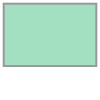

In [88]:
# Create feature
feature = shapely.from_geojson(aoi)
feature

In [89]:
# Get feature bounds
feature.bounds

(38.5513639024837, -6.712371750140903, 39.035604148587, -6.386527687031872)

Feature For NIR Band

In [90]:
print("Raster size:", src_nir.width, src_nir.height)

Raster size: 10980 10980


In [91]:
 # Get raster bounds (extent)
bounds_nir = src_nir.bounds
print("Raster Bounds:", bounds_nir)

    # Get raster CRS (coordinate reference system)
crs_nir = src_nir.crs
print("Raster CRS:", crs_nir)

Raster Bounds: BoundingBox(left=399960.0, bottom=9190240.0, right=509760.0, top=9300040.0)
Raster CRS: EPSG:32737


In [92]:
# Import PyPROJ to enable projection of geographic coordinates to UTM
import pyproj

In [93]:
# Convert bounds to UTM
bounds_nir = pyproj.Proj(src_nir.crs).transform_bounds(*feature.bounds)
bounds_nir

(450385.29283641314, 9258024.558496177, 503937.4268014493, 9294067.506821131)

Feature For RED Band

In [94]:
print("Raster size:", src_red.width, src_red.height)

Raster size: 10980 10980


In [95]:
 # Get raster bounds (extent)
bounds_red = src_red.bounds
print("Raster Bounds:", bounds_red)

    # Get raster CRS (coordinate reference system)
crs_red = src_red.crs
print("Raster CRS:", crs_red)

Raster Bounds: BoundingBox(left=399960.0, bottom=9190240.0, right=509760.0, top=9300040.0)
Raster CRS: EPSG:32737


In [96]:
# Convert bounds to UTM
bounds_red = pyproj.Proj(src_red.crs).transform_bounds(*feature.bounds)
bounds_red

(450385.29283641314, 9258024.558496177, 503937.4268014493, 9294067.506821131)

Green Band

In [97]:
 # Get raster bounds (extent)
bounds_green = src_green.bounds
print("Raster Bounds:", bounds_green)

    # Get raster CRS (coordinate reference system)
crs_green = src_green.crs
print("Raster CRS:", crs_green)

Raster Bounds: BoundingBox(left=399960.0, bottom=9190240.0, right=509760.0, top=9300040.0)
Raster CRS: EPSG:32737


In [98]:
# Convert bounds to UTM
bounds_green = pyproj.Proj(src_green.crs).transform_bounds(*feature.bounds)
bounds_green

(450385.29283641314, 9258024.558496177, 503937.4268014493, 9294067.506821131)

In [100]:
# Store data
# Note: You should set crs and transform correctly. Using src.transform directly won't work, because it is for the whole image, not the specific area
with rasterio.open(
    'B08_ITC.tif',
    'w',
    driver='GTiff',
    height=data_nir.shape[0],
    width=data_nir.shape[1],
    count=1,
    dtype=data_nir.dtype,
    crs_nir=src_nir.crs,
    #transform=rasterio.windows.transform(window_nir, src_nir.transform),
) as dst_nir:
    dst_nir.write(data_nir, 1)

/opt/venv/lib/python3.10/site-packages/rasterio/__init__.py:365: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = writer(


Window for RED band

In [101]:
# Store data
# Note: You should set crs and transform correctly. Using src.transform directly won't work, because it is for the whole image, not the specific area
with rasterio.open(
    'B04_ITC.tif',
    'w',
    driver='GTiff',
    height=data_red.shape[0],
    width=data_red.shape[1],
    count=1,
    dtype=data_red.dtype,
    crs_nir=src_red.crs,
    #transform=rasterio.windows.transform(window_red, src_red.transform),
) as dst_red:
    dst_red.write(data_red, 1)

In [102]:
# Store data
# Note: You should set crs and transform correctly. Using src.transform directly won't work, because it is for the whole image, not the specific area
with rasterio.open(
    'B03_ITC.tif',
    'w',
    driver='GTiff',
    height=data_green.shape[0],
    width=data_green.shape[1],
    count=1,
    dtype=data_green.dtype,
    crs_nir=src_green.crs,
    #transform=rasterio.windows.transform(window_green, src_green.transform),
) as dst_green:
    dst_green.write(data_green, 1)

In [103]:
# Avoid division by zero by adding a small value (epsilon)
epsilon = 1e-10

In [104]:
# Calculate NDVI using the formula (NIR - Red) / (NIR + Red)
ndvi = (data_nir - data_red) / (data_nir + data_red + epsilon)

In [105]:
# Set up a colormap for NDVI visualization
ndvi_cmap = plt.cm.viridis  # Colormap for NDVI
ndvi_cmap.set_bad(color='white')  # Set NaN values to white

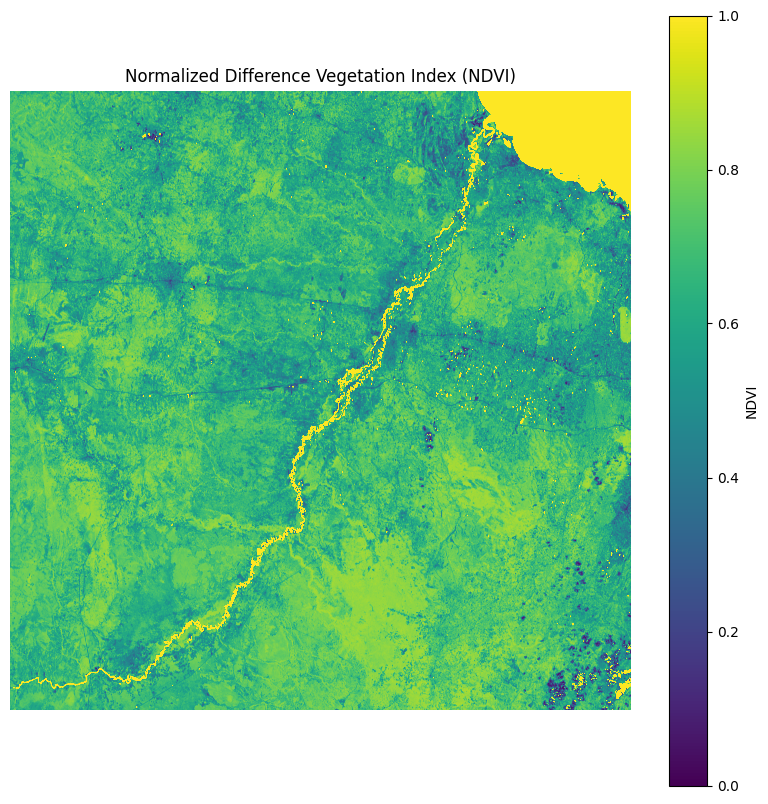

In [106]:
# Plot NDVI
plt.figure(figsize=(10, 10))
plt.imshow(ndvi, cmap=ndvi_cmap, vmin=0, vmax=1)
plt.colorbar(label='NDVI')
plt.title('Normalized Difference Vegetation Index (NDVI)')
plt.axis('off')
plt.show()

In [107]:
data_nir = src_nir.read(1)

In [108]:
data_red = src_red.read(1)

In [109]:
data_green = src_green.read(1)

In [110]:
import numpy as np

In [ ]:
# Normalize the bands for visualization (0-1 range)
def normalize(array):
    """Normalize array to 0-1 range for display."""
    return (array - np.min(array)) / (np.max(array) - np.min(array))

nir_norm = normalize(data_nir)
red_norm = normalize(data_red)
green_norm = normalize(data_green)

# Stack bands to create an RGB image (False Color Composite)
false_color_image = np.dstack((nir_norm, red_norm, green_norm))

# Plot the False Color Composite
plt.figure(figsize=(10, 10))
plt.imshow(false_color_image)
plt.title("False Color Composite (NIR, Red, Green)")
plt.axis('off')
plt.show()

# I am using stack, I left other issues on top

In [141]:
!pip install stackstac

  Using cached stackstac-0.5.1-py3-none-any.whl.metadata (8.1 kB)
Using cached stackstac-0.5.1-py3-none-any.whl (64 kB)

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [160]:
import stackstac

In [161]:
stack = stackstac.stack(items, assets=['red', 'green', 'blue', 'nir'], epsg=32737)

In [162]:
stack

<xarray.DataArray 'stackstac-95138d5668fa280c79b04c7119f2e15b' (time: 1,
                                                                band: 4,
                                                                y: 10980,
                                                                x: 10980)> Size: 4GB
dask.array<fetch_raster_window, shape=(1, 4, 10980, 10980), dtype=float64, chunksize=(1, 1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/54)
  * time                                     (time) datetime64[ns] 8B 2024-06...
    id                                       (time) <U24 96B 'S2B_37MDN_20240...
  * band                                     (band) <U5 80B 'red' ... 'nir'
  * x                                        (x) float64 88kB 4e+05 ... 5.098...
  * y                                        (y) float64 88kB 9.3e+06 ... 9.1...
    s2:snow_ice_percentage                   int64 8B 0
    ...                                       ...
    title                                    (band) <U20 320B 'Red (band 4) -...
    raster:bands                             object 8B {'nodata': 0, 'data_ty...
    common_name                              (band) <U5 80B 'red' ... 'nir'
    center_wavelength                        (band) float64 32B 0.665 ... 0.842
    full_width_half_max                      (band) float64 32B 0.038 ... 0.145
    epsg                                     int64 8B 32737
Attributes:
    spec:        RasterSpec(epsg=32737, bounds=(399960.0, 9190240.0, 509760.0...
    crs:         epsg:32737
    transform:   | 10.00, 0.00, 399960.00|\n| 0.00,-10.00, 9300040.00|\n| 0.0...
    resolution:  10.0

In [166]:
lon, lat = 38.5513639024837, -6.386527687031872

In [147]:
#x, y = pyproj.Proj(stack.crs)(lon, lat)

In [148]:
#x, y

(450385.29283641314, 9294045.90709341)

In [167]:
buffer = 3000

In [168]:
area = stack.loc[..., y+buffer:y-buffer, x-buffer:x+buffer]
area

<xarray.DataArray 'stackstac-95138d5668fa280c79b04c7119f2e15b' (time: 1,
                                                                band: 4,
                                                                y: 600, x: 600)> Size: 12MB
dask.array<getitem, shape=(1, 4, 600, 600), dtype=float64, chunksize=(1, 1, 600, 377), chunktype=numpy.ndarray>
Coordinates: (12/54)
  * time                                     (time) datetime64[ns] 8B 2024-06...
    id                                       (time) <U24 96B 'S2B_37MDN_20240...
  * band                                     (band) <U5 80B 'red' ... 'nir'
  * x                                        (x) float64 5kB 4.474e+05 ... 4....
  * y                                        (y) float64 5kB 9.297e+06 ... 9....
    s2:snow_ice_percentage                   int64 8B 0
    ...                                       ...
    title                                    (band) <U20 320B 'Red (band 4) -...
    raster:bands                             object 8B {'nodata': 0, 'data_ty...
    common_name                              (band) <U5 80B 'red' ... 'nir'
    center_wavelength                        (band) float64 32B 0.665 ... 0.842
    full_width_half_max                      (band) float64 32B 0.038 ... 0.145
    epsg                                     int64 8B 32737
Attributes:
    spec:        RasterSpec(epsg=32737, bounds=(399960.0, 9190240.0, 509760.0...
    crs:         epsg:32737
    transform:   | 10.00, 0.00, 399960.00|\n| 0.00,-10.00, 9300040.00|\n| 0.0...
    resolution:  10.0

In [169]:
data = area.compute()

In [170]:
data

<xarray.DataArray 'stackstac-95138d5668fa280c79b04c7119f2e15b' (time: 1,
                                                                band: 4,
                                                                y: 600, x: 600)> Size: 12MB
array([[[[-8.400e-03,  6.200e-03,  1.440e-02, ..., -3.420e-02,
          -2.240e-02, -4.800e-02],
         [-2.820e-02,  4.400e-03,  1.020e-02, ..., -2.520e-02,
           1.760e-02, -2.000e-02],
         [-4.000e-04,  1.260e-02,  1.180e-02, ..., -1.720e-02,
          -4.000e-04,  7.000e-03],
         ...,
         [-5.090e-02, -4.900e-02, -4.760e-02, ..., -5.340e-02,
          -5.000e-02, -4.440e-02],
         [-5.710e-02, -5.830e-02, -5.940e-02, ..., -4.440e-02,
          -4.080e-02, -3.600e-02],
         [-5.900e-02, -6.320e-02, -6.020e-02, ..., -4.120e-02,
          -3.890e-02, -3.820e-02]],

        [[-7.600e-03,  4.000e-04, -2.000e-03, ..., -2.590e-02,
          -1.420e-02, -3.320e-02],
         [-2.420e-02, -3.400e-03, -4.400e-03, ..., -2.360e-02,
          -4.600e-03, -2.310e-02],
         [-1.120e-02,  4.200e-03, -2.000e-04, ..., -1.920e-02,
          -6.600e-03, -1.110e-02],
...
         [-5.750e-02, -6.000e-02, -5.880e-02, ..., -5.950e-02,
          -5.680e-02, -5.640e-02],
         [-6.080e-02, -6.220e-02, -6.250e-02, ..., -5.660e-02,
          -5.390e-02, -5.460e-02],
         [-6.160e-02, -6.220e-02, -6.290e-02, ..., -5.350e-02,
          -5.420e-02, -5.530e-02]],

        [[ 2.420e-01,  2.308e-01,  2.006e-01, ...,  2.022e-01,
           1.696e-01,  1.426e-01],
         [ 2.352e-01,  2.340e-01,  2.030e-01, ...,  1.840e-01,
           1.512e-01,  1.336e-01],
         [ 2.052e-01,  2.200e-01,  1.996e-01, ...,  1.654e-01,
           1.388e-01,  1.654e-01],
         ...,
         [ 1.872e-01,  1.820e-01,  1.840e-01, ...,  2.548e-01,
           2.376e-01,  2.256e-01],
         [ 1.894e-01,  1.886e-01,  1.996e-01, ...,  2.192e-01,
           2.054e-01,  2.082e-01],
         [ 1.818e-01,  1.910e-01,  2.012e-01, ...,  1.946e-01,
           2.020e-01,  2.046e-01]]]])
Coordinates: (12/54)
  * time                                     (time) datetime64[ns] 8B 2024-06...
    id                                       (time) <U24 96B 'S2B_37MDN_20240...
  * band                                     (band) <U5 80B 'red' ... 'nir'
  * x                                        (x) float64 5kB 4.474e+05 ... 4....
  * y                                        (y) float64 5kB 9.297e+06 ... 9....
    s2:snow_ice_percentage                   int64 8B 0
    ...                                       ...
    title                                    (band) <U20 320B 'Red (band 4) -...
    raster:bands                             object 8B {'nodata': 0, 'data_ty...
    common_name                              (band) <U5 80B 'red' ... 'nir'
    center_wavelength                        (band) float64 32B 0.665 ... 0.842
    full_width_half_max                      (band) float64 32B 0.038 ... 0.145
    epsg                                     int64 8B 32737
Attributes:
    spec:        RasterSpec(epsg=32737, bounds=(399960.0, 9190240.0, 509760.0...
    crs:         epsg:32737
    transform:   | 10.00, 0.00, 399960.00|\n| 0.00,-10.00, 9300040.00|\n| 0.0...
    resolution:  10.0

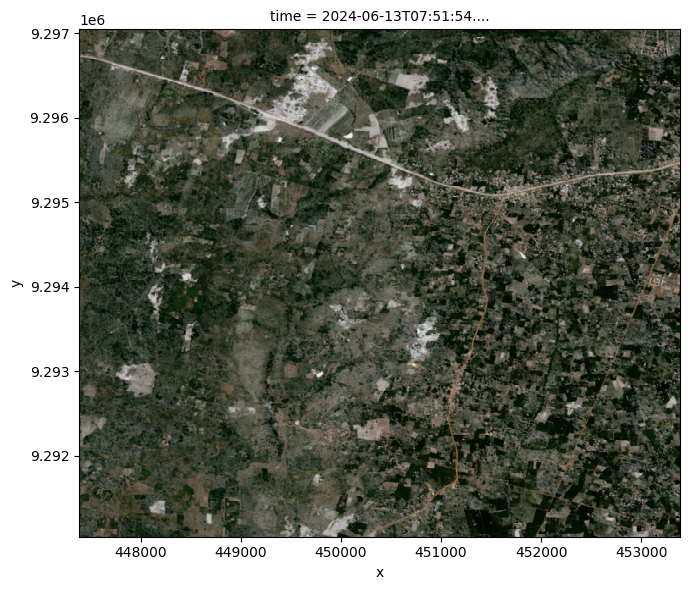

In [171]:
data.plot.imshow(row='time', rgb='band', robust=True, size=6)

In [192]:
import folium

# Create a map centered near the polygon
m = folium.Map(location=[-6.55, 38.8], zoom_start=10)

# Define the polygon coordinates
coords = [
    [38.5513639024837, -6.386527687031872],
    [38.5513639024837, -6.712371750140903],
    [39.035604148587, -6.712371750140903],
    [39.035604148587, -6.386527687031872],
    [38.5513639024837, -6.386527687031872]
]

# Add the polygon
folium.Polygon(
    locations=[list(reversed(c)) for c in coords],  # Reverse to Lat, Lon
    color="blue",
    fill=True,
    fill_color="blue",
    fill_opacity=0.5
).add_to(m)

# Show the map
m.save("polygon_map.html")

In [193]:
src.meta

{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': 0.0,
 'width': 10980,
 'height': 10980,
 'count': 1,
 'crs': CRS.from_epsg(32737),
 'transform': Affine(10.0, 0.0, 399960.0,
        0.0, -10.0, 9300040.0)}

In [173]:
from rasterio.plot import show
numpy_array = data.values  # Extract NumPy array

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0779..0.38280000000000003].


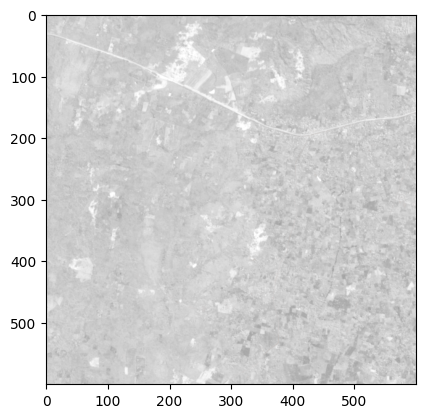

<Axes: >

In [195]:
show(numpy_array)

In [172]:
from rasterio.plot import show_hist
show_hist(numpy_array, bins=50, lw=0.0, stacked=False, alpha=0.3, histtype='stepfilled', title="Histogram")

NameError: name 'numpy_array' is not defined

In [197]:
import numpy as np
bands = src.read()
i = 1
for band in bands:
    print(f"band {i}")
    print({
       'min': band.min(),
       'mean': band.mean(),
       'median': np.median(band),
       'max': band.max()})
    i += 1

band 1
{'min': 116, 'mean': 2778.931206855651, 'median': 2834.0, 'max': 15216}


My Trial - Khiriya

In [2]:
# Avoid division by zero by adding a small value (epsilon)
epsilon = 1e-10

In [3]:
# Calculate NDVI using the formula (NIR - Red) / (NIR + Red)
ndvi = (data_nir - data_red) / (data_nir + data_red + epsilon)


NameError: name 'data_nir' is not defined

In [1]:
# Set up a colormap for NDVI visualization
ndvi_cmap = plt.cm.viridis  # Colormap for NDVI
ndvi_cmap.set_bad(color='white')  # Set NaN values to white

NameError: name 'plt' is not defined

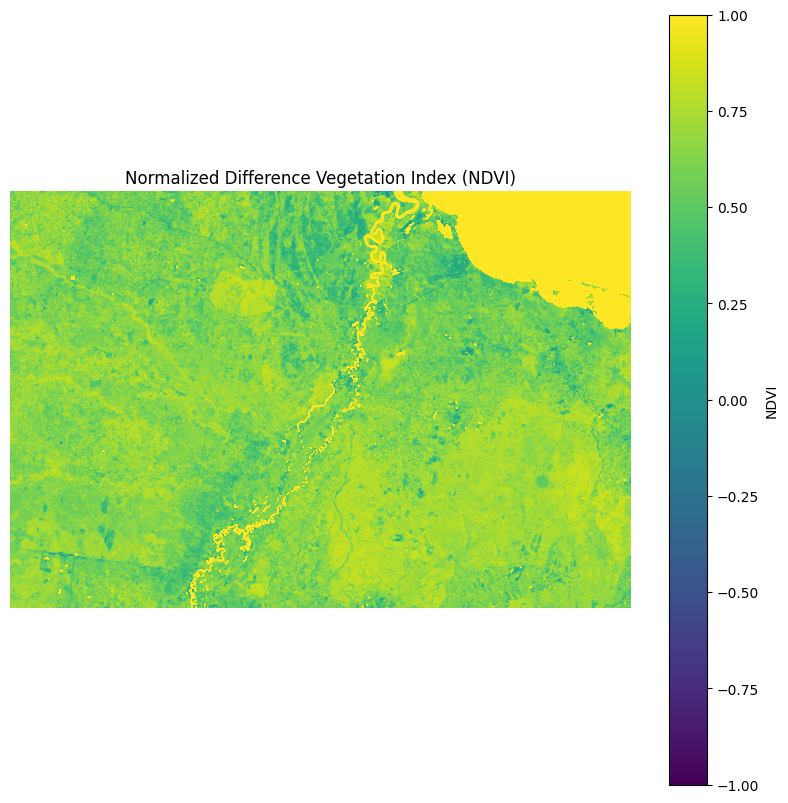

In [214]:
# Plot NDVI
plt.figure(figsize=(10, 10))
plt.imshow(ndvi, cmap=ndvi_cmap, vmin=-1, vmax=1)
plt.colorbar(label='NDVI')
plt.title('Normalized Difference Vegetation Index (NDVI)')
plt.axis('off')
plt.show()